# Notebook2

In [3]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split

housing = pd.read_csv("./housing.csv") # https://github.com/ageron/data/tree/main/housing
housing["income_cat"] = pd.cut(housing["median_income"], bins=[0, 1.5, 3.0, 4.5, 6, np.inf], labels=[1, 2, 3, 4, 5])

strat_train_set, strat_test_set = train_test_split(housing, test_size=0.20, stratify=housing["income_cat"], random_state=42)
for set_ in (strat_train_set, strat_test_set):
    set_.drop("income_cat", axis=1, inplace=True)
housing = strat_train_set.drop("median_house_value", axis=1)
housing_labels = strat_train_set["median_house_value"].copy()

In [5]:
# Simple Feature Engineering via attribute combinations
from ydata_profiling import ProfileReport

housing["rooms_per_house"] = housing["total_rooms"] / housing["households"]
housing["bedrooms_ratio"] = housing["total_bedrooms"] / housing["total_rooms"]
housing["people_per_house"] = housing["population"] / housing["households"]
profile = ProfileReport(housing, title="Pandas Profiling Report")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<Figure size 1000x800 with 0 Axes>

<Axes: >

Text(0.5, 1.0, 'Correlation Matrix Heatmap')

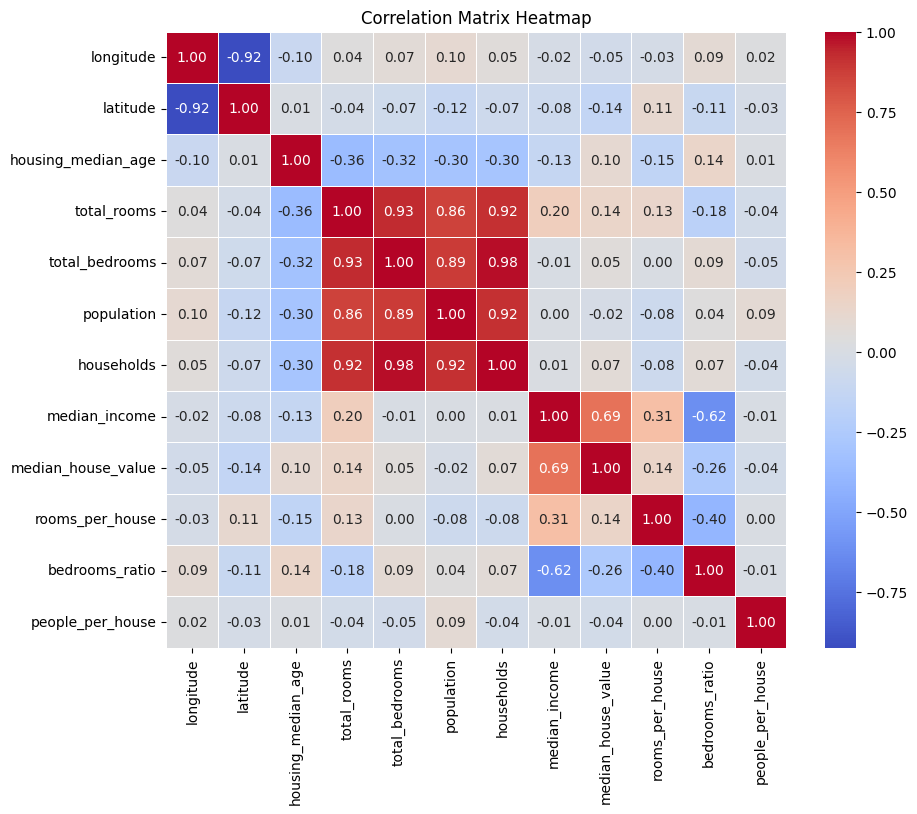

In [12]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

numerical_columns = housing.select_dtypes(include=['number'])

# Compute the correlation matrix for numerical columns
correlation_matrix = numerical_columns.corr()


plt.figure(figsize=(10, 8))  # Set the figure size
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Correlation Matrix Heatmap")


In [14]:
# Data Preprocessing -- fix missing values
from sklearn.impute import SimpleImputer
imputer = SimpleImputer(strategy="median")

housing_num = housing.select_dtypes(include=[np.number])
imputer.fit(housing_num)
housing_num.describe()
pd.DataFrame(imputer.transform(housing_num), columns=housing_num.columns).describe()

SimpleImputer(strategy='median')

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income
count,16512.000000,16512.000000,16512.000000,16512.000000,16344.000000,16512.000000,16512.000000,16512.000000
mean,-119.573125,35.637746,28.577156,2639.402798,538.949094,1425.513929,499.990189,3.870428
std,2.000624,2.133294,12.585738,2185.287466,423.862079,1094.795467,382.865787,1.891936
min,-124.350000,32.550000,1.000000,2.000000,1.000000,3.000000,1.000000,0.499900
25%,-121.800000,33.930000,18.000000,1447.000000,296.000000,787.000000,279.000000,2.562500
50%,-118.510000,34.260000,29.000000,2125.000000,434.000000,1167.000000,408.000000,3.538500
75%,-118.010000,37.720000,37.000000,3154.000000,645.000000,1726.000000,603.000000,4.750000
max,-114.490000,41.950000,52.000000,39320.000000,6210.000000,16305.000000,5358.000000,15.000100


,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income
count,16512.000000,16512.000000,16512.000000,16512.000000,16512.000000,16512.000000,16512.000000,16512.000000
mean,-119.573125,35.637746,28.577156,2639.402798,537.881298,1425.513929,499.990189,3.870428
std,2.000624,2.133294,12.585738,2185.287466,421.831667,1094.795467,382.865787,1.891936
min,-124.350000,32.550000,1.000000,2.000000,1.000000,3.000000,1.000000,0.499900
25%,-121.800000,33.930000,18.000000,1447.000000,297.000000,787.000000,279.000000,2.562500
50%,-118.510000,34.260000,29.000000,2125.000000,434.000000,1167.000000,408.000000,3.538500
75%,-118.010000,37.720000,37.000000,3154.000000,642.000000,1726.000000,603.000000,4.750000
max,-114.490000,41.950000,52.000000,39320.000000,6210.000000,16305.000000,5358.000000,15.000100


In [15]:
# Data Preprocessing -- Handle text attributes
from sklearn.preprocessing import OneHotEncoder

### one hot encoder can handle unknown values by ignoring them! Look up documentation

housing_cat = housing.select_dtypes(include=['object']) # PandasV2
cat_encoder = OneHotEncoder()
housing_cat_1hot = cat_encoder.fit_transform(housing_cat)
housing_cat_1hot.toarray()
cat_encoder.categories_

array([[0., 0., 0., 1., 0.],
       [1., 0., 0., 0., 0.],
       [0., 1., 0., 0., 0.],
       ...,
       [0., 0., 0., 0., 1.],
       [1., 0., 0., 0., 0.],
       [0., 0., 0., 0., 1.]])

[array(['<1H OCEAN', 'INLAND', 'ISLAND', 'NEAR BAY', 'NEAR OCEAN'],
       dtype=object)]

In [ ]:
# Data Preprocessing -- Feature Scaling
from sklearn.preprocessing import MinMaxScaler

min_max_scaler = MinMaxScaler(feature_range=(-1, 1))
housing_num_min_max_scaled = min_max_scaler.fit_transform(housing_num)
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler

std_scaler = StandardScaler()
housing_num_std_scaled = std_scaler.fit_transform(housing_num)


In [ ]:
# Data Preprocessing -- Custom Transformers

from sklearn.preprocessing import FunctionTransformer
from sklearn.cluster import KMeans

log_transformer = FunctionTransformer(np.log, inverse_func=np.exp) # inverse_func option
log_transformer.transform(housing[["population"]])

,population
13096,7.362645
14973,6.501290
3785,6.331502
14689,7.520235
20507,7.555905
...,...
14207,6.843750
13105,7.257708
19301,7.942362
19121,7.452982


In [ ]:
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.utils.validation import check_array, check_is_fitted

class StandardScalerClone(BaseEstimator, TransformerMixin):
    def __init__(self, with_mean=True):  # no *args or **kwargs!
        self.with_mean = with_mean

    def fit(self, X, y=None):  # y is required even though we don't use it
        X = check_array(X)  # checks that X is an array with finite float values
        self.mean_ = X.mean(axis=0)
        self.scale_ = X.std(axis=0)
        self.n_features_in_ = X.shape[1]  # every estimator stores this in fit()
        return self  # always return self!

    def transform(self, X):
        check_is_fitted(self)  # looks for learned attributes (with trailing _)
        X = check_array(X)
        assert self.n_features_in_ == X.shape[1]
        if self.with_mean:
            X = X - self.mean_
        return X / self.scale_

In [ ]:
from sklearn.cluster import KMeans

class ClusterSimilarity(BaseEstimator, TransformerMixin):
    def __init__(self, n_clusters=10, gamma=1.0, random_state=None):
        self.n_clusters = n_clusters
        self.gamma = gamma
        self.random_state = random_state

    def fit(self, X, y=None, sample_weight=None):
        self.kmeans_ = KMeans(self.n_clusters, n_init=10,
                              random_state=self.random_state)
        self.kmeans_.fit(X, sample_weight=sample_weight)
        return self  # always return self!

    def transform(self, X):
        return rbf_kernel(X, self.kmeans_.cluster_centers_, gamma=self.gamma)

    def get_feature_names_out(self, names=None):
        return [f"Cluster {i} similarity" for i in range(self.n_clusters)]

In [11]:
import numpy as np
from sklearn.datasets import make_blobs
from sklearn.metrics.pairwise import rbf_kernel
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.cluster import KMeans


# Define the ClusterSimilarity class
class ClusterSimilarity(BaseEstimator, TransformerMixin):
    def __init__(self, n_clusters=10, gamma=1.0, random_state=None):
        self.n_clusters = n_clusters
        self.gamma = gamma
        self.random_state = random_state

    def fit(self, X, y=None, sample_weight=None):
        self.kmeans_ = KMeans(self.n_clusters, n_init=10, random_state=self.random_state)
        self.kmeans_.fit(X, sample_weight=sample_weight)
        return self  # always return self!

    def transform(self, X):
        return rbf_kernel(X, self.kmeans_.cluster_centers_, gamma=self.gamma)

    def fit_transform(self, X, y=None, sample_weight=None):
        self.fit(X, y, sample_weight)
        return self.transform(X)

    def get_feature_names_out(self, names=None):
        return [f"Cluster {i} similarity" for i in range(self.n_clusters)]

# Generate some sample data
X, y = make_blobs(n_samples=10, centers=3, n_features=2, random_state=42)

# Instantiate the ClusterSimilarity transformer
cluster_sim = ClusterSimilarity(n_clusters=3, gamma=0.5, random_state=42)

# Fit and transform the data
similarity_matrix = cluster_sim.fit_transform(X)

# Print the original data and the resulting similarity matrix
print("Original Data (X):")
print(X)
print("\nCluster Centers:")
print(cluster_sim.kmeans_.cluster_centers_)
print("\nSimilarity Matrix (fit_transform output):")
print(similarity_matrix)

Original Data (X):
[[-5.41397842 -7.10588589]
 [-7.42400992 -6.769187  ]
 [ 3.62704772  2.28741702]
 [-6.81209899 -8.30485778]
 [-2.26723535  7.10100588]
 [-2.97867201  9.55684617]
 [-0.92998481  9.78172086]
 [ 2.914961    1.41088215]
 [ 3.73185476  0.56086598]
 [-2.97261532  8.54855637]]

Cluster Centers:
[[-6.55002911 -7.39331023]
 [-2.28712687  8.74703232]
 [ 3.42462116  1.41972172]]

Similarity Matrix (fit_transform output):
[[5.03278314e-01 2.01625537e-57 1.78942476e-33]
 [5.61756878e-01 9.79826866e-59 7.61772432e-41]
 [1.44263700e-43 2.20758932e-17 6.72377177e-01]
 [6.37755829e-01 2.59768844e-68 5.12843842e-44]
 [2.49800830e-50 2.57973257e-01 9.04006383e-15]
 [6.95471207e-66 5.67215161e-01 5.23079534e-24]
 [1.22170360e-71 2.33118709e-01 4.99726363e-20]
 [5.18478201e-37 2.73497668e-18 8.78169364e-01]
 [2.01903751e-37 3.81418698e-23 6.59671807e-01]
 [1.08267553e-58 7.75192762e-01 1.19631119e-20]]


<Axes: xlabel='Longitude', ylabel='Latitude'>

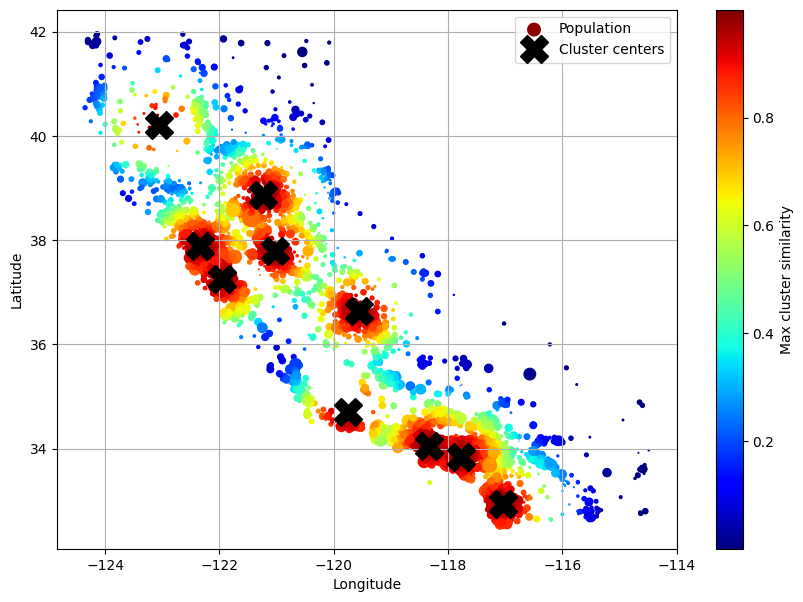

In [18]:
cluster_simil = ClusterSimilarity(n_clusters=10, gamma=1., random_state=42)
similarities = cluster_simil.fit_transform(housing[["latitude", "longitude"]],
                                           sample_weight=housing_labels)

housing_renamed = housing.rename(columns={
    "latitude": "Latitude", "longitude": "Longitude",
    "population": "Population",
    "median_house_value": "Median house value (ᴜsᴅ)"})
housing_renamed["Max cluster similarity"] = similarities.max(axis=1)

housing_renamed.plot(kind="scatter", x="Longitude", y="Latitude", grid=True,
                     s=housing_renamed["Population"] / 100, label="Population",
                     c="Max cluster similarity",
                     cmap="jet", colorbar=True,
                     legend=True, sharex=False, figsize=(10, 7))
plt.plot(cluster_simil.kmeans_.cluster_centers_[:, 1],
         cluster_simil.kmeans_.cluster_centers_[:, 0],
         linestyle="", color="black", marker="X", markersize=20,
         label="Cluster centers")
plt.legend(loc="upper right")
plt.show()

In [20]:
similarities[1,:]

array([5.82488504e-14, 9.90046143e-01, 1.62296800e-10, 3.84360842e-02,
       4.56888397e-04, 1.31326258e-13, 1.10891612e-01, 2.99695991e-26,
       6.32121447e-01, 1.49980122e-09])

In [35]:
from sklearn.pipeline import Pipeline, make_pipeline

num_pipeline = Pipeline([
    ("impute", SimpleImputer(strategy="median")),
    ("standardize", StandardScaler()),
])

num_pipeline
num_pipeline.named_steps

x = pd.DataFrame(num_pipeline.fit_transform(housing_num), columns=num_pipeline.get_feature_names_out())
x["total_bedrooms"].isnull().sum()

Pipeline(steps=[('impute', SimpleImputer(strategy='median')),
                ('standardize', StandardScaler())])

{'impute': SimpleImputer(strategy='median'), 'standardize': StandardScaler()}

np.int64(0)

In [36]:


num_pipeline = make_pipeline(SimpleImputer(strategy="median"), StandardScaler())
from sklearn import set_config


num_pipeline
num_pipeline.named_steps

Pipeline(steps=[('simpleimputer', SimpleImputer(strategy='median')),
                ('standardscaler', StandardScaler())])

{'simpleimputer': SimpleImputer(strategy='median'),
 'standardscaler': StandardScaler()}

In [ ]:
# Explicit
from sklearn.compose import ColumnTransformer

num_attribs = ["longitude", "latitude", "housing_median_age", "total_rooms",
               "total_bedrooms", "population", "households", "median_income"]
cat_attribs = ["ocean_proximity"]

num_pipeline = make_pipeline(
    SimpleImputer(strategy="median"),
    StandardScaler())

cat_pipeline = make_pipeline(
    SimpleImputer(strategy="most_frequent"),
    OneHotEncoder(handle_unknown="ignore"))

preprocessing = ColumnTransformer([
    ("num", num_pipeline, num_attribs),
    ("cat", cat_pipeline, cat_attribs),
])


In [ ]:
from sklearn.compose import make_column_selector, make_column_transformer


num_pipeline = make_pipeline(
    SimpleImputer(strategy="median"),
    StandardScaler())

cat_pipeline = make_pipeline(
    SimpleImputer(strategy="most_frequent"),
    OneHotEncoder(handle_unknown="ignore"))

preprocessing = make_column_transformer(
    (num_pipeline, make_column_selector(dtype_include=np.number)),
    (cat_pipeline, make_column_selector(dtype_include=object)),
)


In [43]:
housing_prepared = preprocessing.fit_transform(housing)
housing_prepared_fr = pd.DataFrame(
    housing_prepared,
    columns=preprocessing.get_feature_names_out(),
    index=housing.index)
housing_prepared_fr.head(2)

,pipeline-1__longitude,pipeline-1__latitude,pipeline-1__housing_median_age,pipeline-1__total_rooms,pipeline-1__total_bedrooms,pipeline-1__population,pipeline-1__households,pipeline-1__median_income,pipeline-2__ocean_proximity_<1H OCEAN,pipeline-2__ocean_proximity_INLAND,pipeline-2__ocean_proximity_ISLAND,pipeline-2__ocean_proximity_NEAR BAY,pipeline-2__ocean_proximity_NEAR OCEAN
13096,-1.423037,1.013606,1.861119,0.311912,1.368167,0.137460,1.394812,-0.936491,0.0,0.0,0.0,1.0,0.0
14973,0.596394,-0.702103,0.907630,-0.308620,-0.435925,-0.693771,-0.373485,1.171942,1.0,0.0,0.0,0.0,0.0


In [15]:
from sklearn.compose import make_column_selector, make_column_transformer
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.utils.validation import check_array, check_is_fitted
from sklearn.pipeline import make_pipeline
from sklearn.linear_model import Ridge
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import FunctionTransformer
from sklearn.cluster import KMeans
from sklearn.compose import ColumnTransformer



def column_ratio(X):
    return X[:, [0]] / X[:, [1]]

def ratio_name(function_transformer, feature_names_in):
    return ["ratio"]  # feature names out

def ratio_pipeline():
    return make_pipeline(
        SimpleImputer(strategy="median"),
        FunctionTransformer(column_ratio, feature_names_out=ratio_name),
        StandardScaler())

log_pipeline = make_pipeline(
    SimpleImputer(strategy="median"),
    FunctionTransformer(np.log, feature_names_out="one-to-one"),
    StandardScaler())


cluster_simil = ClusterSimilarity(n_clusters=10, gamma=1., random_state=42)
default_num_pipeline = make_pipeline(SimpleImputer(strategy="median"),
                                     StandardScaler())
preprocessing = ColumnTransformer([
        ("bedrooms", ratio_pipeline(), ["total_bedrooms", "total_rooms"]),
        ("rooms_per_house", ratio_pipeline(), ["total_rooms", "households"]),
        ("people_per_house", ratio_pipeline(), ["population", "households"]),
        ("log", log_pipeline, ["total_bedrooms", "total_rooms", "population",
                               "households", "median_income"]),
        ("geo", cluster_simil, ["latitude", "longitude"]),
        ("cat", cat_pipeline, make_column_selector(dtype_include=object)),
    ],
    remainder=default_num_pipeline)  # one column remaining: housing_median_age

### **Code Explanation**

#### **1. `column_ratio` Function**
```python
def column_ratio(X):
    return X[:, [0]] / X[:, [1]]
```
- This function takes a 2D array `X` as input and computes the ratio of the first column (`X[:, [0]]`) to the second column (`X[:, [1]]`).
- It assumes that `X` has at least two columns, and the operation is performed element-wise for all rows.

---

#### **2. `ratio_name` Function**
```python
def ratio_name(function_transformer, feature_names_in):
    return ["ratio"]  # feature names out
```
- This function is used to define the output feature name(s) for the `FunctionTransformer` that applies the `column_ratio` function.
- It always returns a single feature name, `"ratio"`, regardless of the input feature names.

---

#### **3. `ratio_pipeline` Function**
```python
def ratio_pipeline():
    return make_pipeline(
        SimpleImputer(strategy="median"),
        FunctionTransformer(column_ratio, feature_names_out=ratio_name),
        StandardScaler())
```
- This function creates a pipeline for preprocessing numerical data by:
  1. **Imputing missing values** using the median (`SimpleImputer(strategy="median")`).
  2. **Transforming the data** by applying the `column_ratio` function using `FunctionTransformer`.
  3. **Standardizing the data** using `StandardScaler` to ensure the output has a mean of 0 and a standard deviation of 1.

---

#### **4. `log_pipeline`**
```python
log_pipeline = make_pipeline(
    SimpleImputer(strategy="median"),
    FunctionTransformer(np.log, feature_names_out="one-to-one"),
    StandardScaler())
```
- This pipeline preprocesses numerical data by:
  1. Imputing missing values with the median.
  2. Applying the natural logarithm transformation (`np.log`) to the data.
  3. Standardizing the transformed data.

---

#### **5. `cluster_simil`**
```python
cluster_simil = ClusterSimilarity(n_clusters=10, gamma=1., random_state=42)
```
- This creates a `ClusterSimilarity` object, which transforms data into cluster similarity features.
- It clusters the data into 10 clusters and computes similarity scores for each cluster using a radial basis function (RBF) kernel with `gamma=1.0`.

---

#### **6. `default_num_pipeline`**
```python
default_num_pipeline = make_pipeline(SimpleImputer(strategy="median"),
                                     StandardScaler())
```
- This pipeline handles numerical data by imputing missing values with the median and standardizing the data.

---

#### **7. `preprocessing`**
```python
preprocessing = ColumnTransformer([
        ("bedrooms", ratio_pipeline(), ["total_bedrooms", "total_rooms"]),
        ("rooms_per_house", ratio_pipeline(), ["total_rooms", "households"]),
        ("people_per_house", ratio_pipeline(), ["population", "households"]),
        ("log", log_pipeline, ["total_bedrooms", "total_rooms", "population",
                               "households", "median_income"]),
        ("geo", cluster_simil, ["latitude", "longitude"]),
        ("cat", cat_pipeline, make_column_selector(dtype_include=object)),
    ],
    remainder=default_num_pipeline)  # one column remaining: housing_median_age
```
- **Purpose**: This `ColumnTransformer` applies different preprocessing pipelines to different subsets of features in the dataset.
- **Transformations**:
  1. **`bedrooms`**: Applies the `ratio_pipeline` to compute the ratio of `total_bedrooms` to `total_rooms`.
  2. **`rooms_per_house`**: Applies the `ratio_pipeline` to compute the ratio of `total_rooms` to `households`.
  3. **`people_per_house`**: Applies the `ratio_pipeline` to compute the ratio of `population` to `households`.
  4. **`log`**: Applies the `log_pipeline` to transform several numerical features using the natural logarithm.
  5. **`geo`**: Applies the `ClusterSimilarity` transformation to latitude and longitude.
  6. **`cat`**: Applies a categorical pipeline (`cat_pipeline`) to all categorical features (selected using `make_column_selector(dtype_include=object)`).
- **`remainder` Parameter**:
  - The `remainder` parameter specifies how to handle columns that are not explicitly listed in the `ColumnTransformer`.
  - Here, it is set to `default_num_pipeline`, meaning that any remaining columns (in this case, `housing_median_age`) will be processed using the `default_num_pipeline` (imputation + standardization).

---

### **Role of the `remainder` Parameter**
The `remainder` parameter in `ColumnTransformer` determines what happens to columns that are not explicitly mentioned in the transformations. It can take the following values:
1. **`"drop"` (default)**: Drops any columns not specified in the transformations.
2. **`"passthrough"`**: Leaves the remaining columns unchanged and includes them in the output.
3. **A pipeline or transformer**: Applies the specified pipeline or transformer to the remaining columns.

In this code:
```python
remainder=default_num_pipeline
```
- The `default_num_pipeline` (imputation + standardization) is applied to the remaining column, `housing_median_age`.

---

### **Summary**
- The code defines a preprocessing pipeline for a dataset, applying different transformations to different feature groups.
- The `remainder` parameter ensures that any columns not explicitly mentioned (like `housing_median_age`) are still processed using a default pipeline.
- The `ratio_pipeline` computes ratios between pairs of columns, while other pipelines handle logarithmic transformations, clustering, and categorical data.

In [46]:
ratio_pipeline().fit_transform(housing[["total_rooms", "households"]])


array([[-0.86602737],
       [ 0.0245495 ],
       [-0.04119332],
       ...,
       [-0.10998748],
       [-0.36093745],
       [-1.32397227]])

In [48]:
housing_prepared = preprocessing.fit_transform(housing)
housing_prepared.shape

(16512, 24)

In [49]:
preprocessing.get_feature_names_out()

array(['bedrooms__ratio', 'rooms_per_house__ratio',
       'people_per_house__ratio', 'log__total_bedrooms',
       'log__total_rooms', 'log__population', 'log__households',
       'log__median_income', 'geo__Cluster 0 similarity',
       'geo__Cluster 1 similarity', 'geo__Cluster 2 similarity',
       'geo__Cluster 3 similarity', 'geo__Cluster 4 similarity',
       'geo__Cluster 5 similarity', 'geo__Cluster 6 similarity',
       'geo__Cluster 7 similarity', 'geo__Cluster 8 similarity',
       'geo__Cluster 9 similarity', 'cat__ocean_proximity_<1H OCEAN',
       'cat__ocean_proximity_INLAND', 'cat__ocean_proximity_ISLAND',
       'cat__ocean_proximity_NEAR BAY', 'cat__ocean_proximity_NEAR OCEAN',
       'remainder__housing_median_age'], dtype=object)

In [ ]:
from sklearn.linear_model import LinearRegression

lin_reg = make_pipeline(preprocessing, LinearRegression())
lin_reg.fit(housing, housing_labels)
housing_predictions = lin_reg.predict(housing)
housing_predictions[:5].round(-2)
housing_labels.iloc[:5].values

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(remainder=Pipeline(steps=[('simpleimputer',
                                                              SimpleImputer(strategy='median')),
                                                             ('standardscaler',
                                                              StandardScaler())]),
                                   transformers=[('bedrooms',
                                                  Pipeline(steps=[('simpleimputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('functiontransformer',
                                                                   FunctionTransformer(feature_names_out=<function ratio_name at 0x7fc...
                                                   'median_income']),
                                                 ('geo',
                                                  ClusterSimilarity(random_state=42),
                                                  ['latitude', 'longitude']),
                                                 ('cat',
                                                  Pipeline(steps=[('simpleimputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehotencoder',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x7fcc54992720>)])),
                ('linearregression', LinearRegression())])

array([242800., 375900., 127500.,  99400., 324600.])

array([458300., 483800., 101700.,  96100., 361800.])

In [56]:
lin_reg.get_params()

{'memory': None,
 'steps': [('columntransformer',
   ColumnTransformer(remainder=Pipeline(steps=[('simpleimputer',
                                                SimpleImputer(strategy='median')),
                                               ('standardscaler',
                                                StandardScaler())]),
                     transformers=[('bedrooms',
                                    Pipeline(steps=[('simpleimputer',
                                                     SimpleImputer(strategy='median')),
                                                    ('functiontransformer',
                                                     FunctionTransformer(feature_names_out=<function ratio_name at 0x7fcc549b54e0>,
                                                                         func=<function column_ratio...
                                    ['total_bedrooms', 'total_rooms', 'population',
                                     'households', 'median_income

In [51]:
error_ratios = housing_predictions[:5].round(-2) / housing_labels.iloc[:5].values - 1
print(", ".join([f"{100 * ratio:.1f}%" for ratio in error_ratios]))

-47.0%, -22.3%, 25.4%, 3.4%, -10.3%


In [52]:
from sklearn.metrics import root_mean_squared_error

lin_rmse = root_mean_squared_error(housing_labels, housing_predictions)
lin_rmse

np.float64(68647.95686706669)

In [54]:
!pip install dagshub mlflow

In [58]:
import os

MLFLOW_TRACKING_URI="https://dagshub.com/mkzia/fall2024_housing_model.mlflow"
os.environ['MLFLOW_TRACKING_USERNAME']='mkzia'
os.environ['MLFLOW_TRACKING_PASSWORD']='0d48244c4d4e8778139d46eebe26abaafb053a20'


import mlflow
from mlflow.models import infer_signature

# Set our tracking server uri for logging
mlflow.set_tracking_uri(uri=MLFLOW_TRACKING_URI)

# Create a new MLflow Experiment
mlflow.set_experiment("fall24_house_pricing")

score = lin_rmse
params = {"test": 1}
with mlflow.start_run():
      # Log the hyperparameters
      mlflow.log_params(params)

      # Log metrics
      mlflow.log_metric("RMSE", score)
      # Infer the model signature
      signature = infer_signature(housing, lin_reg.predict(housing))

      # Log the model
      model_info = mlflow.sklearn.log_model(
          sk_model=lin_reg,
          artifact_path="housing_model",
          signature=signature,
          input_example=housing,
          registered_model_name="LinearRegression",
      )

<Experiment: artifact_location='mlflow-artifacts:/05b162d4f80c4138b6ea264a8866334a', creation_time=1733441612548, experiment_id='0', last_update_time=1733441612548, lifecycle_stage='active', name='fall24_house_pricing', tags={}>

Successfully registered model 'LinearRegression'.
2024/12/05 18:34:53 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model name: LinearRegression, version 1
Created version '1' of model 'LinearRegression'.


🏃 View run mercurial-dog-170 at: https://dagshub.com/mkzia/fall2024_housing_model.mlflow/#/experiments/0/runs/a68e5c0518674d1f99feb77f71c57ba7
🧪 View experiment at: https://dagshub.com/mkzia/fall2024_housing_model.mlflow/#/experiments/0


In [59]:
from sklearn.tree import DecisionTreeRegressor

tree_reg = make_pipeline(preprocessing, DecisionTreeRegressor(random_state=42))
tree_reg.fit(housing, housing_labels)
housing_predictions = tree_reg.predict(housing)
tree_rmse = root_mean_squared_error(housing_labels, housing_predictions)
tree_rmse

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(remainder=Pipeline(steps=[('simpleimputer',
                                                              SimpleImputer(strategy='median')),
                                                             ('standardscaler',
                                                              StandardScaler())]),
                                   transformers=[('bedrooms',
                                                  Pipeline(steps=[('simpleimputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('functiontransformer',
                                                                   FunctionTransformer(feature_names_out=<function ratio_name at 0x7fc...
                                                  ClusterSimilarity(random_state=42),
                                                  ['latitude', 'longitude']),
                                                 ('cat',
                                                  Pipeline(steps=[('simpleimputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehotencoder',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  <sklearn.compose._column_transformer.make_column_selector object at 0x7fcc54992720>)])),
                ('decisiontreeregressor',
                 DecisionTreeRegressor(random_state=42))])

np.float64(0.0)

In [ ]:
from sklearn.model_selection import cross_val_score

tree_rmses = -cross_val_score(tree_reg, housing, housing_labels,
                              scoring="neg_root_mean_squared_error", cv=10)

# The cross_val_score function returns scores where higher is better.
# For metrics like RMSE (where lower is better), scikit-learn negates the values to fit this convention.

In [65]:
tree_rmses.mean()
pd.Series(tree_rmses).describe()

np.float64(67153.31827313449)

count       10.000000
mean     67153.318273
std       1963.580924
min      63925.253106
25%      66083.277180
50%      66795.829871
75%      68074.018403
max      70664.635833
dtype: float64

In [64]:
tree_reg[1].get_params()

{'ccp_alpha': 0.0,
 'criterion': 'squared_error',
 'max_depth': None,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'monotonic_cst': None,
 'random_state': 42,
 'splitter': 'best'}

In [66]:
import os

MLFLOW_TRACKING_URI="https://dagshub.com/mkzia/fall2024_housing_model.mlflow"
os.environ['MLFLOW_TRACKING_USERNAME']='mkzia'
os.environ['MLFLOW_TRACKING_PASSWORD']='0d48244c4d4e8778139d46eebe26abaafb053a20'


import mlflow
from mlflow.models import infer_signature

# Set our tracking server uri for logging
mlflow.set_tracking_uri(uri=MLFLOW_TRACKING_URI)

# Create a new MLflow Experiment
mlflow.set_experiment("fall24_house_pricing")

score = tree_rmses.mean()
params = tree_reg[1].get_params()
with mlflow.start_run():
      # Log the hyperparameters
      mlflow.log_params(params)

      # Log metrics
      mlflow.log_metric("RMSE", score)
      # Infer the model signature
      signature = infer_signature(housing, tree_reg.predict(housing))

      # Log the model
      model_info = mlflow.sklearn.log_model(
          sk_model=tree_reg,
          artifact_path="housing_model",
          signature=signature,
          input_example=housing,
          registered_model_name="DecisionTreeRegressor",
      )

<Experiment: artifact_location='mlflow-artifacts:/05b162d4f80c4138b6ea264a8866334a', creation_time=1733441612548, experiment_id='0', last_update_time=1733441612548, lifecycle_stage='active', name='fall24_house_pricing', tags={}>

Successfully registered model 'DecisionTreeRegressor'.
2024/12/05 18:42:35 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model name: DecisionTreeRegressor, version 1
Created version '1' of model 'DecisionTreeRegressor'.


🏃 View run powerful-lamb-609 at: https://dagshub.com/mkzia/fall2024_housing_model.mlflow/#/experiments/0/runs/49cc66617a91443eb5b583be22e5313c
🧪 View experiment at: https://dagshub.com/mkzia/fall2024_housing_model.mlflow/#/experiments/0


In [62]:
lin_rmses = -cross_val_score(lin_reg, housing, housing_labels,
                              scoring="neg_root_mean_squared_error", cv=10)
pd.Series(lin_rmses).describe()

count       10.000000
mean     69847.923224
std       4078.407329
min      65659.761079
25%      68088.799156
50%      68697.591463
75%      69800.966364
max      80685.254832
dtype: float64

In [17]:
from sklearn.ensemble import RandomForestRegressor

forest_reg = make_pipeline(preprocessing,
                           RandomForestRegressor(random_state=42))
# forest_rmses = -cross_val_score(forest_reg, housing, housing_labels,
#                                 scoring="neg_root_mean_squared_error", cv=10)
# pd.Series(forest_rmses).describe()

In [18]:
forest_reg.fit(housing, housing_labels)
housing_predictions = forest_reg.predict(housing)


NameError: name 'root_mean_squared_error' is not defined

In [19]:
from sklearn.metrics import root_mean_squared_error
forest_rmse = root_mean_squared_error(housing_labels, housing_predictions)
forest_rmse

np.float64(17547.52124624957)

In [71]:
from sklearn.model_selection import GridSearchCV

full_pipeline = Pipeline([
    ("preprocessing", preprocessing),
    ("random_forest", RandomForestRegressor(random_state=42)),
])
param_grid = [
    {'preprocessing__geo__n_clusters': [5, 8, 10],
     'random_forest__max_features': [4, 6, 8]},
    {'preprocessing__geo__n_clusters': [10, 15],
     'random_forest__max_features': [6, 8, 10]},
]
grid_search = GridSearchCV(full_pipeline, param_grid, cv=3,
                           scoring='neg_root_mean_squared_error')
grid_search.fit(housing, housing_labels)

GridSearchCV(cv=3,
             estimator=Pipeline(steps=[('preprocessing',
                                        ColumnTransformer(remainder=Pipeline(steps=[('simpleimputer',
                                                                                     SimpleImputer(strategy='median')),
                                                                                    ('standardscaler',
                                                                                     StandardScaler())]),
                                                          transformers=[('bedrooms',
                                                                         Pipeline(steps=[('simpleimputer',
                                                                                          SimpleImputer(strategy='median')),
                                                                                         ('functiontransformer',
                                                                                          FunctionTransformer(feature_names_out=<f...
                                                                         <sklearn.compose._column_transformer.make_column_selector object at 0x7fcc54992720>)])),
                                       ('random_forest',
                                        RandomForestRegressor(random_state=42))]),
             param_grid=[{'preprocessing__geo__n_clusters': [5, 8, 10],
                          'random_forest__max_features': [4, 6, 8]},
                         {'preprocessing__geo__n_clusters': [10, 15],
                          'random_forest__max_features': [6, 8, 10]}],
             scoring='neg_root_mean_squared_error')

In [77]:
grid_search.best_params_
-grid_search.best_score_

{'preprocessing__geo__n_clusters': 15, 'random_forest__max_features': 6}

np.float64(43952.588192716525)

In [78]:
cv_res = pd.DataFrame(grid_search.cv_results_)
cv_res.sort_values(by="mean_test_score", ascending=False, inplace=True)

# extra code – these few lines of code just make the DataFrame look nicer
cv_res = cv_res[["param_preprocessing__geo__n_clusters",
                 "param_random_forest__max_features", "split0_test_score",
                 "split1_test_score", "split2_test_score", "mean_test_score"]]
score_cols = ["split0", "split1", "split2", "mean_test_rmse"]
cv_res.columns = ["n_clusters", "max_features"] + score_cols
cv_res[score_cols] = -cv_res[score_cols].round().astype(np.int64)

cv_res.head()

,n_clusters,max_features,split0,split1,split2,mean_test_rmse
12,15,6,43536,43753,44569,43953
13,15,8,44084,44205,44863,44384
14,15,10,44368,44496,45200,44688
7,10,6,44251,44628,45857,44912
9,10,6,44251,44628,45857,44912


In [ ]:


from sklearn.pipeline import make_pipeline
from sklearn.linear_model import Ridge
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
# from xgboost.sklearn import XGBRegressor

y_train = train['median_house_value']
X_train = train.drop('median_house_value', axis=1)

y_test = test['median_house_value']
X_test = test.drop('median_house_value', axis=1)

pipelines = {
    'ridge': make_pipeline(preprocessing, Ridge()),
    'rf': make_pipeline(preprocessing, RandomForestRegressor()),
    'gb': make_pipeline(preprocessing, GradientBoostingRegressor()),
    # 'xg': make_pipeline(preprocessing, XGBRegressor()),
}


grid = {
    'ridge':{'ridge__alpha':[0.05, 0.25, 0.5, 1.0]},
    'rf':{
        'randomforestregressor__n_estimators':[50,100,150],
        'randomforestregressor__max_depth':[5,6,7,None]
    },
    'gb':{
        'gradientboostingregressor__n_estimators':[50,100,150],
        'gradientboostingregressor__max_depth':[5,6,7, None]
    },
    # 'xg':{
    #    'xgbregressor__n_estimators':[50,100,150],
    #    'xgbregressor__max_depth':[5,6,7,None]
    # }
}


from sklearn.model_selection import GridSearchCV
import time
total_start = time.monotonic()
fit_models = {}
for algo, pipeline in pipelines.items():
    try:
        print(algo)
        start = time.monotonic()
        model = GridSearchCV(pipeline, grid[algo], n_jobs=-1, cv=10, scoring='r2')
        model.fit(X_train, y_train)
        fit_models[algo] = model
        end = time.monotonic()
        print(algo, end-start)
    except Exception as e:
        print(f'Model {algo} had an error {e}')

end = time.monotonic()
print(end-total_start)


# https://github.com/mkzia/eas503/blob/master/old/spring2024/week14/gcolab.ipynb


In [ ]:
import os

MLFLOW_TRACKING_URI="https://dagshub.com/mkzia/house_models.mlflow"
os.environ['MLFLOW_TRACKING_USERNAME']='mkzia'
os.environ['MLFLOW_TRACKING_PASSWORD']='bbbc0c41d162cdc2a38ab1aacdc1a8ff6987d08f'


import mlflow
from mlflow.models import infer_signature

# Set our tracking server uri for logging
mlflow.set_tracking_uri(uri=MLFLOW_TRACKING_URI)

# Create a new MLflow Experiment
mlflow.set_experiment("median_house_pricing")

# Start an MLflow run
for algo, model in fit_models.items():
  score = model.best_score_
  params = model.best_params_
  with mlflow.start_run():
      # Log the hyperparameters
      mlflow.log_params(params)

      # Log metrics
      mlflow.log_metric("r2", score)
      # Infer the model signature
      signature = infer_signature(X_train, model.best_estimator_.predict(X_train))

      # Log the model
      model_info = mlflow.sklearn.log_model(
          sk_model=model,
          artifact_path="housing_model",
          signature=signature,
          input_example=X_train,
          registered_model_name=algo,
      )

In [20]:
import joblib

# Save the model
joblib.dump(forest_reg, 'random_forest_model_v1.pkl')

['random_forest_model_v1.pkl']

In [83]:
model = grid_search.best_estimator_

In [84]:
root_mean_squared_error(housing_labels, model.predict(housing))

array([438743.91630435, 457343.08      , 108316.        , ...,
       144973.0990991 , 489995.91      , 232980.        ])

np.float64(16012.022381795468)

In [86]:
test = strat_test_set.drop("median_house_value", axis=1)
test_labels = strat_test_set["median_house_value"].copy()
root_mean_squared_error(test_labels, model.predict(test))

np.float64(43426.577409177575)

In [21]:
import joblib
final_model_reloaded = joblib.load("random_forest_model_v1.pkl")


In [22]:
root_mean_squared_error(housing_labels, final_model_reloaded.predict(housing))

np.float64(17547.52124624957)

In [ ]:
# GET
# POST

In [23]:
!pip install dill


  Using cached dill-0.3.9-py3-none-any.whl.metadata (10 kB)
Using cached dill-0.3.9-py3-none-any.whl (119 kB)


In [26]:
import dill
with open('rfr_v1.pkl', 'wb') as f:
    dill.dump(forest_reg, f)

In [27]:
import dill
with open('rfr_v1.pkl', 'rb') as f:
    reloaded_model = dill.load(f)

In [29]:
root_mean_squared_error(housing_labels, reloaded_model.predict(housing))

np.float64(17547.52124624957)

In [31]:
housing

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity
13096,-122.42,37.80,52.0,3321.0,1115.0,1576.0,1034.0,2.0987,NEAR BAY
14973,-118.38,34.14,40.0,1965.0,354.0,666.0,357.0,6.0876,<1H OCEAN
3785,-121.98,38.36,33.0,1083.0,217.0,562.0,203.0,2.4330,INLAND
14689,-117.11,33.75,17.0,4174.0,851.0,1845.0,780.0,2.2618,INLAND
20507,-118.15,33.77,36.0,4366.0,1211.0,1912.0,1172.0,3.5292,NEAR OCEAN
...,...,...,...,...,...,...,...,...,...
14207,-118.40,33.86,41.0,2237.0,597.0,938.0,523.0,4.7105,<1H OCEAN
13105,-119.31,36.32,23.0,2945.0,592.0,1419.0,532.0,2.5733,INLAND
19301,-117.06,32.59,13.0,3920.0,775.0,2814.0,760.0,4.0616,NEAR OCEAN
19121,-118.40,34.06,37.0,3781.0,873.0,1725.0,838.0,4.1455,<1H OCEAN


In [35]:
!pip install requests

In [36]:
row = housing.iloc[0]
row.to_dict()

{'longitude': -122.42,
 'latitude': 37.8,
 'housing_median_age': 52.0,
 'total_rooms': 3321.0,
 'total_bedrooms': 1115.0,
 'population': 1576.0,
 'households': 1034.0,
 'median_income': 2.0987,
 'ocean_proximity': 'NEAR BAY'}

In [39]:
import json
data = json.dumps(row.to_dict(), indent=2)
print(data)

{
  "longitude": -122.42,
  "latitude": 37.8,
  "housing_median_age": 52.0,
  "total_rooms": 3321.0,
  "total_bedrooms": 1115.0,
  "population": 1576.0,
  "households": 1034.0,
  "median_income": 2.0987,
  "ocean_proximity": "NEAR BAY"
}


In [2]:
import requests
import json
data = {
  "longitude": -122.42,
  "latitude": 37.8,
  "housing_median_age": 52.0,
  "total_rooms": 3321.0,
  "total_bedrooms": 1115.0,
  "population": 1576.0,
  "households": 1034.0,
  "median_income": 2.0987,
  "ocean_proximity": "NEAR BAY"
}

data = json.dumps(data, indent=2)
print(data)
r = requests.post('http://159.65.246.99:8002/predict', data=data)
r.json()

{
  "longitude": -122.42,
  "latitude": 37.8,
  "housing_median_age": 52.0,
  "total_rooms": 3321.0,
  "total_bedrooms": 1115.0,
  "population": 1576.0,
  "households": 1034.0,
  "median_income": 2.0987,
  "ocean_proximity": "NEAR BAY"
}


JSONDecodeError: Expecting value: line 1 column 1 (char 0)

In [3]:
r

<Response [500]>

In [49]:
housing_labels.iloc[3]

np.float64(96100.0)

In [60]:
import math
housing_orignal = pd.read_csv("./housing.csv") # https://github.com/ageron/data/tree/main/housing

slider_fields = [
    "longitude",
    "latitude",
    "housing_median_age",
    "total_rooms",
    "total_bedrooms",
    "population",
    "households",
    "median_income",
]

single_select_fields = ["ocean_proximity"]
from collections import defaultdict
streamlit_field_data = defaultdict(dict)

for field in slider_fields:
    streamlit_field_data["slider_fields"][field] = [math.floor(housing_orignal[field].min()), math.ceil(housing_orignal[field].max())]

for field in single_select_fields:
    streamlit_field_data["single_select_fields"][field] = sorted(housing_orignal["ocean_proximity"].unique())

import json
json.dump(streamlit_field_data, open("streamlit_options.json", "w"), indent=2)

['<1H OCEAN', 'INLAND', 'ISLAND', 'NEAR BAY', 'NEAR OCEAN']